# Bubble Shear Test Case

As outlined in McManus et al(2017)[1] Section 5.1, there is an advection problem with a time-dependent velocity field that is periodic. The equation we solve is the pure scalar advection equation 
$$
\frac{\partial u}{\partial t} + \nabla \cdot (\mathbf{c} u) = 0
$$

where $\mathbf{c}$ is defined as 
$$
c(x, y, t) = \begin{bmatrix}
2 \sin^2(\pi x) \sin(2\pi y) \cos \left(\frac{2\pi t}{T}\right) \\
-2\sin(2 \pi x) \sin^2(\pi y) \cos \left(\frac{2\pi t}{T}\right) \\
\end{bmatrix}
$$

At $t = 0$, $u = 0$ everywhere except in a ball of radius $0.1$ centered in $(0.5, 0.8)$, which models a bubble and where u = 1. This bubble is sheared as per the advecting velocity field. 

In [1]:
from firedrake import *
from pyroteus import *
from pyroteus_adjoint import *
import matplotlib.pyplot as plt
from movement import *
%matplotlib inline
plt.rcParams['figure.facecolor'] = 'white'  # Ensure  background on plots is white

T = Constant(1.000)
B_RADIUS = 0.1
B_X = 0.5
B_Y = 0.8
QOI_RADIUS = B_RADIUS * 1.1


def apply_supg(test_function, c):
    """
    Apply SUPG stabilization in the sense of modifying the test function.
    """
    unorm = sqrt(dot(c, c))
    cellsize = CellSize(test_function.function_space().mesh())
    tau = 0.5*cellsize/unorm
    inc = tau*dot(c, grad(test_function))
    return test_function + conditional(unorm > 0, inc, 0)


def get_velocity(coords, t):
    x, y = coords
    return as_vector([
        2*sin(pi*x)*sin(pi*x)*sin(2*pi*y)*cos(2*pi*t/T),
        -2*sin(2*pi*x)*sin(pi*y)*sin(pi*y)*cos(2*pi*t/T)])
        

def get_form(mesh_seq):
    def form(index, solutions):
        u, u_ = solutions["u"]
        P = mesh_seq.time_partition
        t_start, t_end = P.subintervals[index]
        dt = Constant(P.timesteps[index])
        t = t_start + index * dt
        P1_vec = VectorFunctionSpace(u.function_space().mesh(), "CG", 1)
        c = Function(P1_vec, name="c")
        c.interpolate(get_velocity(SpatialCoordinate(P1_vec.mesh()), t))
        v = apply_supg(TestFunction(u.function_space()), c)
#       TODO: Try integrating by parts
#       TODO: + diffusive term?
        F = (
            inner((u - u_) / dt, v) * dx
#             + inner(nabla_div(u * c), v) * dx
            + inner(dot(nabla_grad(u), c), v) * dx
            + inner(dot(u, nabla_div(c)), v) * dx
        )
        return F

    return form


def get_solver(mesh_seq):
    def solver(index, ic):
        function_space = mesh_seq.function_spaces["u"][index]
        u = Function(function_space)
        u_ = Function(function_space, name="u_old")
        u_.assign(ic["u"])
        
        
        P1_vec = VectorFunctionSpace(u.function_space().mesh(), "CG", 1)
        c = Function(P1_vec, name="c")
        
        # Define form
        F = mesh_seq.form(index, {"u": (u, u_), "c": (c, )})

        # Time integrate from start to end
        P = mesh_seq.time_partition
        t_start, t_end = P.subintervals[index]
        dt = P.timesteps[index]
        t = t_start
        while t < t_end - 1e-5:
            c.interpolate(get_velocity(SpatialCoordinate(P1_vec.mesh()), t))
            solve(F == 0, u, ad_block_tag="u")
            u_.assign(u)
            t += dt
        return {"u": u}

    return solver


def get_function_spaces(mesh):
    return {"u": FunctionSpace(mesh, "CG", 1),
            "c": VectorFunctionSpace(mesh, "CG", 1)}


def get_initial_condition(mesh_seq):
    fs = mesh_seq.function_spaces["u"][0]
    x, y = SpatialCoordinate(fs.mesh())
    c = conditional(le((x-B_X)**2 + (y-B_Y)**2, B_RADIUS**2), 1, 0)
    u = Function(fs, name='u_initial')
    u.interpolate(c)
    return {"u": u}


def get_qoi(mesh_seq, solutions, i):
    def end_time_qoi():
        u = solutions["u"]
        # Define the initial condition again, but on the end-time mesh
        # and end-time function space
        fs = u.function_space()
        x, y = SpatialCoordinate(fs.mesh())
        c = conditional(le((x-B_X)**2 + (y-B_Y)**2, B_RADIUS**2), 1, 0)
        ic = Function(fs)
        ic.interpolate(c)
        # Restrict the domain to be a disc of radius 10% larger than the bubble
#         disc_domain = Function(fs).interpolate(
#             conditional(le((x-B_X)**2 + (y-B_Y)**2, QOI_RADIUS**2), 1, 0)
#         )
        return inner((ic-u), (ic-u)) * dx

    
#     dt = Constant(mesh_seq.time_partition[i].timestep)
#     def time_integrated_qoi(t):
#         u = solutions["u"]
#         return dt * inner(u, u) * dx
        

    return end_time_qoi

firedrake:WARNING OMP_NUM_THREADS is not set or is set to a value greater than 1, we suggest setting OMP_NUM_THREADS=1 to improve performance


In [2]:
n_adapt = 0
adapt_tol = 1e-3
n = 64
fields = ["u"]
mesh = UnitSquareMesh(n, n, diagonal='left')
meshes = [mesh]
end_time = 0.500
dt = 0.01
num_subintervals = len(meshes)
timesteps_per_export = 1
print("Timesteps per export: {}".format(timesteps_per_export))
time_partition = TimePartition(
    end_time, num_subintervals, dt, fields, timesteps_per_export=timesteps_per_export,
)
mesh_seq = GoalOrientedMeshSeq(
    time_partition,
    meshes,
    get_function_spaces=get_function_spaces,
    get_initial_condition=get_initial_condition,
    get_form=get_form,
    get_solver=get_solver,
    get_qoi=get_qoi,
    qoi_type="end_time"
)

solutions, indicators = mesh_seq.indicate_errors(
    enrichment_kwargs={"enrichment_method": "p"}
)
print("QOI in forward solve: {:.5f}".format(mesh_seq.J))

Timesteps per export: 1
QOI in forward solve: 0.04101


50
50


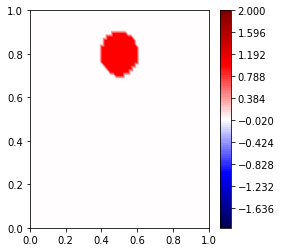

In [3]:
ic = solutions['u']['forward_old'][0][0]
print(len(solutions['u']['forward_old'][0]))
print(len(solutions["u"]["forward"][0]))
fig, axs = plt.subplots(1, 1, figsize=(4, 4))
tc = tricontourf(ic, axes=axs, cmap='seismic', vmin=-2, vmax=2, levels=np.linspace(-2, 2, 100))
fig.colorbar(tc, ax=axs)

50.0
5 10


Text(0.5, 1.0, 'Forward solution (0)')

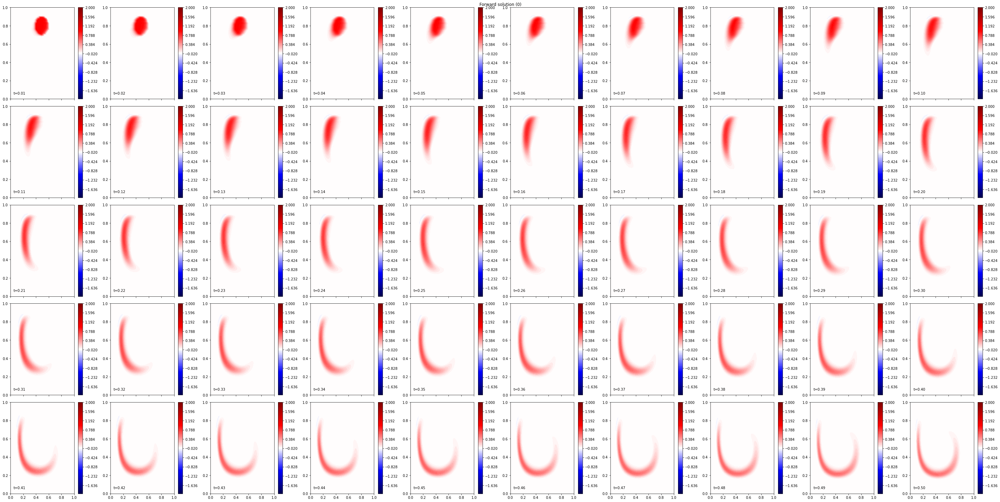

In [4]:
def plot_field(solutions, time_partition, field="u", label="forward", rows=None, cols=None, **kwargs):
    P = time_partition
    if rows is None or cols is None:
        rows = (P.exports_per_subinterval[0] - 1) // 2
        cols = (P.num_subintervals * 2)
    steady = rows == cols == 1
    print(rows, cols)
    dt = P.timesteps[0]
    figsize = kwargs.pop("figsize", (4 * cols, 4 * rows))
    fig, axes = plt.subplots(rows, cols, sharex="col", figsize=figsize)
    tcs = []
    idx = -1
    for i in range(rows):
        tc = []
        for j in range(cols):
            idx += 1
            ax = axes[i, j]
            # Element-wise norm for the indicators
            tc.append(tricontourf(solutions[field][label][0][idx], axes=ax, **kwargs))
            if not steady:
                time = (idx + 1) * dt * timesteps_per_export
                ax.annotate(f"t={time:.2f}", (0.05, 0.05), color="black")
            fig.colorbar(tc[-1], ax=ax)
        tcs.append(tc)
    plt.tight_layout()
    return fig, axes, tcs


# figsize = (5, 80)
steps = int(end_time / dt) / timesteps_per_export
print(steps)
rows, cols = 5, 10
vmin, vmax = -2, 2
fig, axes, tcs = plot_field(
    solutions, time_partition, "u", "forward", cmap='seismic',
    vmin=vmin, vmax=vmax, rows=rows, cols=cols, levels=np.linspace(vmin, vmax, 100))
# fig.tight_layout()
plt.suptitle("Forward solution ({})".format(n_adapt), ha='center', va='top', y=1.0)

5 10


Text(0.5, 1.0, 'Adjoint solution (0)')

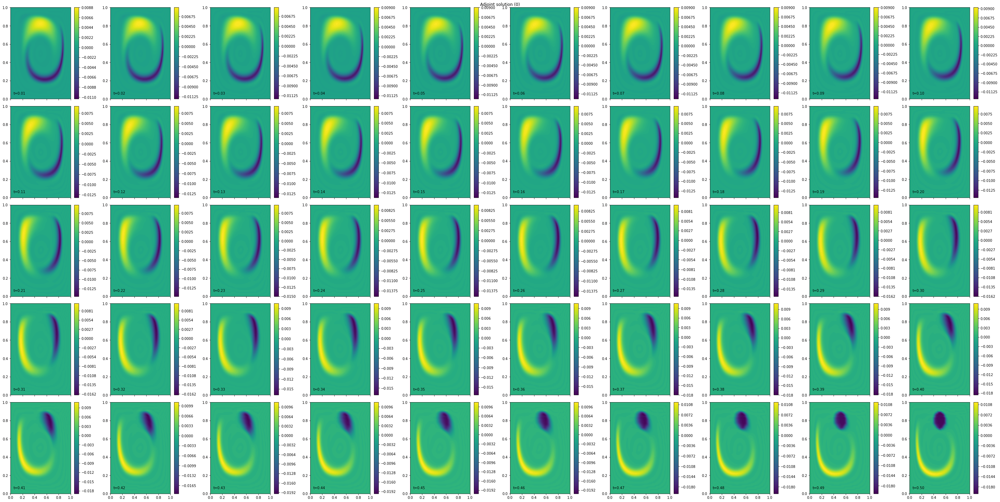

In [5]:
fig, axes, tcs = plot_field(
    solutions, time_partition, "u", "adjoint", cmap='viridis', rows=rows, cols=cols, levels=100)
plt.suptitle("Adjoint solution ({})".format(n_adapt), ha='center', va='top', y=1.0)

Text(0.5, 1.0, 'DWR Indicators (0)')

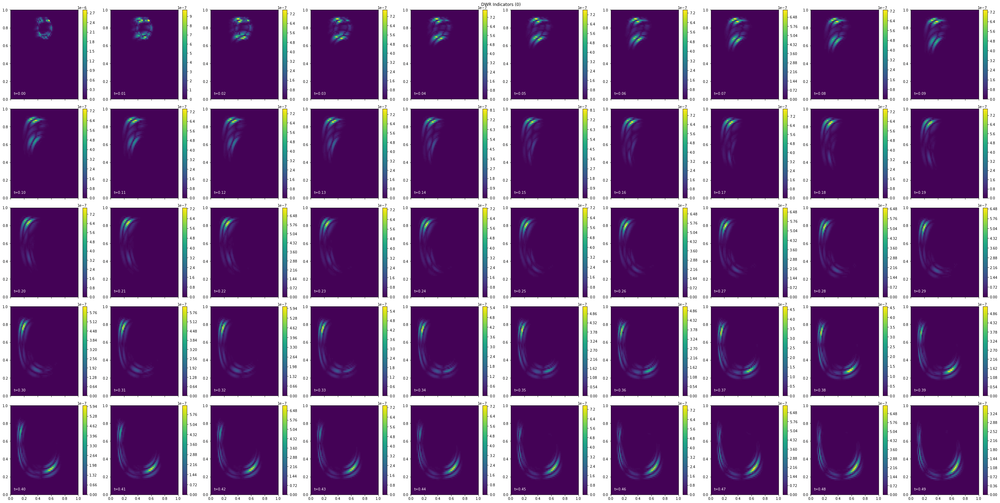

In [6]:
def plot_indicators(indicators, time_partition, **kwargs):
    P = time_partition
    rows = kwargs.pop('rows', (P.exports_per_subinterval[0] - 1) // 2)
    cols = kwargs.pop('cols', (P.num_subintervals * 2))
    steady = rows == cols == 1
#     print(rows, cols)
    dt = P.timesteps[0]
    figsize = kwargs.pop("figsize", (4 * cols, 4 * rows))
    fig, axes = plt.subplots(rows, cols, sharex="col", figsize=figsize)
    tcs = []
    idx = -1
    for i in range(rows):
        tc = []
        for j in range(cols):
            idx += 1
            ax = axes[i, j]
            # Element-wise norm for the indicators
            tc.append(tricontourf(indicators[0][idx], axes=ax, **kwargs))
            if not steady:
                time = idx * dt * timesteps_per_export
                ax.annotate(f"t={time:.2f}", (0.05, 0.05), color="white")
            fig.colorbar(tc[-1], ax=ax)
        tcs.append(tc)
    plt.tight_layout()
    return fig, axes, tcs

fig, axs, tcs = plot_indicators(indicators, time_partition, rows=rows, cols=cols, levels=100)
plt.suptitle("DWR Indicators ({})".format(n_adapt), ha='center', va='top', y=1.0)

## Define Monitor Function

Text(0.5, 1.0, 'Monitor Function (0)')

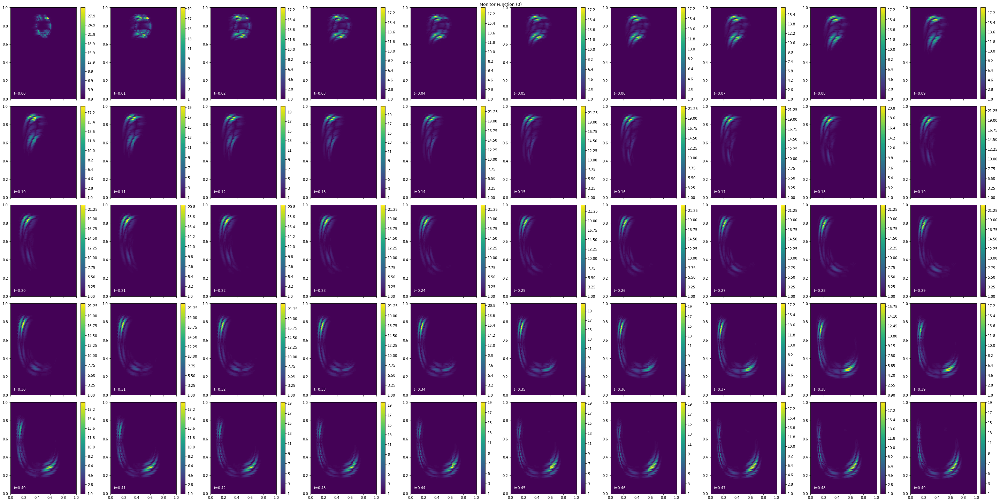

In [7]:
def standardize(arr):
    """
    Apply standardization based on mean and standard deviation
    """
    normed = (arr - np.mean(arr)) / np.std(arr)
    normed -= np.min(normed)
    normed += 1
    return normed

def lp_normalize(arr, p=2):
    """
    Normalize in L^p space.
    """
    retval = arr**p
    denom = sum(retval) ** (1 / p)
    retval /= denom
    return retval



p = 1
standardized_indicators = []
normalized_indicators = []
P0 = FunctionSpace(mesh_seq[0], "DG", 0)
for i in range(len(indicators)):
    t1 = []
    t2 = []
    for j in range(len(indicators[0])):
        t1.append(Function(P0, val=standardize(indicators[i][j].dat.data)))
        t2.append(Function(P0, val=lp_normalize(indicators[i][j].dat.data, p=p)))
    standardized_indicators.append(t1)
    normalized_indicators.append(t2)

fig, axs, tcs = plot_indicators(standardized_indicators, time_partition, rows=rows, cols=cols, levels=100)
plt.suptitle("Monitor Function ({})".format(n_adapt), ha='center', va='top', y=1.0)

In [8]:
import time
meshes = [UnitSquareMesh(n, n, diagonal='left') for i in range(len(indicators[0]))]
num_subintervals = len(meshes)
time_partition = TimePartition(
    end_time, num_subintervals, dt, fields, timesteps_per_export=1
)
def get_get_monitor(mesh, i, indicators):
    def get_monitor(mesh):
        P0 = FunctionSpace(mesh, "DG", 0)
        f = Function(P0)
        f.project(indicators[0][i])
        return f
    return get_monitor
start = time.time()
lap = start
for i, mesh in enumerate(meshes):
    print("Starting on mesh {}".format(i))
    get_mon = get_get_monitor(mesh, i, standardized_indicators)
    mover = MongeAmpereMover(mesh, get_mon, method="quasi_newton", maxiter=100, rtol=adapt_tol)
    mover.move();
    print("Took: {:.4f}s".format(time.time() - lap))
    lap = time.time()
n_adapt += 1
print("Overall took {:.4f}s".format(time.time() - start))

Starting on mesh 0
   0   Min/Max 5.8362e-02   Residual 7.0905e-01   Equidistribution 9.9791e-01
   1   Min/Max 1.0439e-01   Residual 4.8648e-01   Equidistribution 9.9899e-01
   2   Min/Max 6.2064e-02   Residual 3.9503e-01   Equidistribution 9.9900e-01
   3   Min/Max 8.1026e-02   Residual 3.0417e-01   Equidistribution 9.9913e-01
   4   Min/Max 8.6676e-02   Residual 2.4080e-01   Equidistribution 9.9915e-01
   5   Min/Max 1.4854e-01   Residual 1.7912e-01   Equidistribution 9.9946e-01
   6   Min/Max 1.0135e-01   Residual 1.4614e-01   Equidistribution 9.9926e-01
   7   Min/Max 1.6274e-01   Residual 9.8543e-02   Equidistribution 9.9948e-01
   8   Min/Max 2.4785e-01   Residual 6.8396e-02   Equidistribution 9.9960e-01
   9   Min/Max 2.1087e-01   Residual 4.8558e-02   Equidistribution 9.9958e-01
Converged in 9 iterations.
Took: 42.8813s
Starting on mesh 1
   0   Min/Max 7.4101e-02   Residual 6.5015e-01   Equidistribution 9.9835e-01
   1   Min/Max 5.7387e-02   Residual 4.7919e-01   Equidistribu

   1   Min/Max 1.1370e-01   Residual 4.6202e-01   Equidistribution 9.9921e-01
   2   Min/Max 9.5367e-02   Residual 3.4919e-01   Equidistribution 9.9927e-01
   3   Min/Max 1.2159e-01   Residual 2.6744e-01   Equidistribution 9.9938e-01
   4   Min/Max 1.5326e-01   Residual 2.0789e-01   Equidistribution 9.9947e-01
   5   Min/Max 1.6965e-01   Residual 1.5559e-01   Equidistribution 9.9949e-01
   6   Min/Max 2.5708e-01   Residual 1.0702e-01   Equidistribution 9.9962e-01
   7   Min/Max 3.0373e-01   Residual 7.5695e-02   Equidistribution 9.9966e-01
   8   Min/Max 3.4692e-01   Residual 5.2249e-02   Equidistribution 9.9971e-01
Converged in 8 iterations.
Took: 25.7318s
Starting on mesh 11
   0   Min/Max 9.8960e-02   Residual 5.8733e-01   Equidistribution 9.9877e-01
   1   Min/Max 1.0182e-01   Residual 4.5903e-01   Equidistribution 9.9914e-01
   2   Min/Max 1.1352e-01   Residual 3.4446e-01   Equidistribution 9.9928e-01
   3   Min/Max 1.0656e-01   Residual 2.7161e-01   Equidistribution 9.9935e-01
  

   2   Min/Max 9.9453e-02   Residual 3.2480e-01   Equidistribution 9.9927e-01
   3   Min/Max 1.1316e-01   Residual 2.4839e-01   Equidistribution 9.9936e-01
   4   Min/Max 1.1564e-01   Residual 1.8859e-01   Equidistribution 9.9943e-01
   5   Min/Max 1.2450e-01   Residual 1.5581e-01   Equidistribution 9.9948e-01
   6   Min/Max 1.7755e-01   Residual 1.1427e-01   Equidistribution 9.9958e-01
   7   Min/Max 2.7413e-01   Residual 8.1356e-02   Equidistribution 9.9964e-01
   8   Min/Max 3.1891e-01   Residual 5.8518e-02   Equidistribution 9.9971e-01
   9   Min/Max 3.5129e-01   Residual 4.1243e-02   Equidistribution 9.9972e-01
Converged in 9 iterations.
Took: 35.7725s
Starting on mesh 21
   0   Min/Max 9.1480e-02   Residual 5.5013e-01   Equidistribution 9.9867e-01
   1   Min/Max 8.3055e-02   Residual 4.4543e-01   Equidistribution 9.9904e-01
   2   Min/Max 9.9028e-02   Residual 3.2552e-01   Equidistribution 9.9920e-01
   3   Min/Max 1.1748e-01   Residual 2.4254e-01   Equidistribution 9.9938e-01
  

   5   Min/Max 1.7960e-01   Residual 1.2713e-01   Equidistribution 9.9958e-01
   6   Min/Max 1.6879e-01   Residual 1.0273e-01   Equidistribution 9.9956e-01
   7   Min/Max 2.7561e-01   Residual 7.1998e-02   Equidistribution 9.9966e-01
   8   Min/Max 3.3072e-01   Residual 5.5176e-02   Equidistribution 9.9968e-01
   9   Min/Max 3.7169e-01   Residual 3.8430e-02   Equidistribution 9.9972e-01
Converged in 9 iterations.
Took: 34.2014s
Starting on mesh 31
   0   Min/Max 9.4617e-02   Residual 5.5399e-01   Equidistribution 9.9871e-01
   1   Min/Max 8.7370e-02   Residual 4.3271e-01   Equidistribution 9.9900e-01
   2   Min/Max 9.7139e-02   Residual 3.1443e-01   Equidistribution 9.9921e-01
   3   Min/Max 1.3089e-01   Residual 2.3042e-01   Equidistribution 9.9943e-01
   4   Min/Max 1.3703e-01   Residual 1.7036e-01   Equidistribution 9.9950e-01
   5   Min/Max 1.6910e-01   Residual 1.3393e-01   Equidistribution 9.9946e-01
   6   Min/Max 2.3152e-01   Residual 9.3994e-02   Equidistribution 9.9957e-01
  

   7   Min/Max 3.8413e-01   Residual 3.7754e-02   Equidistribution 9.9972e-01
Converged in 7 iterations.
Took: 24.0645s
Starting on mesh 42
   0   Min/Max 6.3531e-02   Residual 8.0094e-01   Equidistribution 9.9808e-01
   1   Min/Max 1.1562e-01   Residual 4.1841e-01   Equidistribution 9.9925e-01
   2   Min/Max 1.6127e-01   Residual 2.7953e-01   Equidistribution 9.9947e-01
   3   Min/Max 1.9051e-01   Residual 1.9346e-01   Equidistribution 9.9958e-01
   4   Min/Max 2.0422e-01   Residual 1.4359e-01   Equidistribution 9.9961e-01
   5   Min/Max 2.0312e-01   Residual 1.0548e-01   Equidistribution 9.9963e-01
   6   Min/Max 2.7326e-01   Residual 7.7013e-02   Equidistribution 9.9968e-01
   7   Min/Max 3.7991e-01   Residual 5.4556e-02   Equidistribution 9.9972e-01
   8   Min/Max 4.0393e-01   Residual 3.8819e-02   Equidistribution 9.9973e-01
Converged in 8 iterations.
Took: 24.3006s
Starting on mesh 43
   0   Min/Max 6.1927e-02   Residual 8.1579e-01   Equidistribution 9.9803e-01
   1   Min/Max 7.8

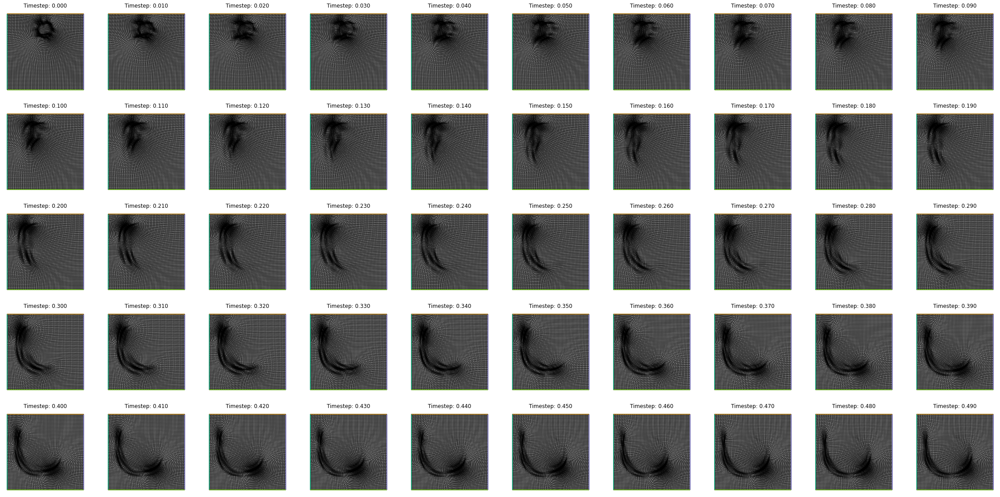

In [9]:
def plot_mesh(mesh, fig=None, axes=None, time_partition=None, **kwargs):
    kwargs.setdefault("interior_kw", {"linewidth": 0.5})
    kwargs.setdefault("boundary_kw", {"linewidth": 2.0})
    if fig is None and axes is None:
        fig, axes = plt.subplots(figsize=(5, 5))
    tp = triplot(mesh, axes=axes, **kwargs)
    axes.axis(False)
    return fig, axes, tp


fig, axs = plt.subplots(rows, cols, figsize=(4 * cols, 4 * rows))
tps = []
tp = []
for i in range(len(meshes)):
    row, col = i // (len(meshes) // rows), i % cols
    _, _, plot = plot_mesh(meshes[i], fig=fig, axes=axs[row, col])
    tp.append(plot)
    if time_partition is not None:
        time = i * dt * timesteps_per_export
        axs[row, col].set_title("Timestep: {:.3f}".format(time))
tps.append(tp)
# fig.tight_layout(pad=0.5)
# plt.suptitle("Adapted meshes")

In [10]:
print("Computing quality metrics")
print("Metric\t\tMin\t\tMax")
quality_measures = {}
for i, mesh in enumerate(meshes):
    print(i)
    quality_measures = {}
    quality_measures["min_angle"] = get_min_angles2d(mesh)
    quality_measures["aspect_ratio"] = get_aspect_ratios2d(mesh)
    quality_measures["skewness"] = get_skewnesses2d(mesh)
    quality_measures["scaled_jac"] = get_scaled_jacobians2d(mesh)
    print("Mesh {}".format(i))

    for key in quality_measures.keys():
        print(
            "{}\t\t\t{:.3f}\t\t\t{:.3f}".format(
                key,
                np.min(quality_measures[key].dat.data),
                np.max(quality_measures[key].dat.data),
            )
        )
# for key in quality_measures[0].keys():
#     out_file = File(f"quality_measures_big/{key}.pvd")
#     for i in range(len(meshes)):
#         out_file.write(quality_measures[i][key])
#     print("Wrote to {}".format(out_file))

Computing quality metrics
Metric		Min		Max
0
Mesh 0
min_angle			0.196			1.029
aspect_ratio			1.000			6.796
skewness			0.017			1.264
scaled_jac			0.195			0.857
1
Mesh 1
min_angle			0.169			1.021
aspect_ratio			1.001			6.702
skewness			0.036			1.258
scaled_jac			0.169			0.853
2
Mesh 2
min_angle			0.176			1.036
aspect_ratio			1.000			5.381
skewness			0.018			1.240
scaled_jac			0.175			0.861
3
Mesh 3
min_angle			0.181			1.034
aspect_ratio			1.000			5.197
skewness			0.022			1.223
scaled_jac			0.180			0.859
4
Mesh 4
min_angle			0.185			1.042
aspect_ratio			1.000			5.080
skewness			0.008			1.216
scaled_jac			0.184			0.864
5
Mesh 5
min_angle			0.187			1.029
aspect_ratio			1.000			4.780
skewness			0.024			1.218
scaled_jac			0.186			0.857
6
Mesh 6
min_angle			0.182			1.043
aspect_ratio			1.000			4.523
skewness			0.006			1.223
scaled_jac			0.181			0.864
7
Mesh 7
min_angle			0.178			1.032
aspect_ratio			1.000			4.126
skewness			0.016			1.236
scaled_jac			0.177			0.858
8
Mesh 8
min_angle			0.181			

In [11]:
print(len(meshes))
for i, mesh in enumerate(meshes):
    out_file = File(f"all_adapt/{i}.pvd")
    out_file.write(mesh.coordinates)
    print(f"Wrote {i}")

50
Wrote 0
Wrote 1
Wrote 2
Wrote 3
Wrote 4
Wrote 5
Wrote 6
Wrote 7
Wrote 8
Wrote 9
Wrote 10
Wrote 11
Wrote 12
Wrote 13
Wrote 14
Wrote 15
Wrote 16
Wrote 17
Wrote 18
Wrote 19
Wrote 20
Wrote 21
Wrote 22
Wrote 23
Wrote 24
Wrote 25
Wrote 26
Wrote 27
Wrote 28
Wrote 29
Wrote 30
Wrote 31
Wrote 32
Wrote 33
Wrote 34
Wrote 35
Wrote 36
Wrote 37
Wrote 38
Wrote 39
Wrote 40
Wrote 41
Wrote 42
Wrote 43
Wrote 44
Wrote 45
Wrote 46
Wrote 47
Wrote 48
Wrote 49


## Re-computing the forward, adjoint, QOI, and Monitor Function

In [12]:
mesh_seq = GoalOrientedMeshSeq(
    time_partition,
    meshes,
    get_function_spaces=get_function_spaces,
    get_initial_condition=get_initial_condition,
    get_form=get_form,
    get_solver=get_solver,
    get_qoi=get_qoi,
    qoi_type="end_time",
)
solutions = mesh_seq.solve_adjoint()
print("New QOI: {:.5f}".format(mesh_seq.J))

New QOI: 0.00804


5 10


Text(0.5, 1.0, 'Forward solution (1)')

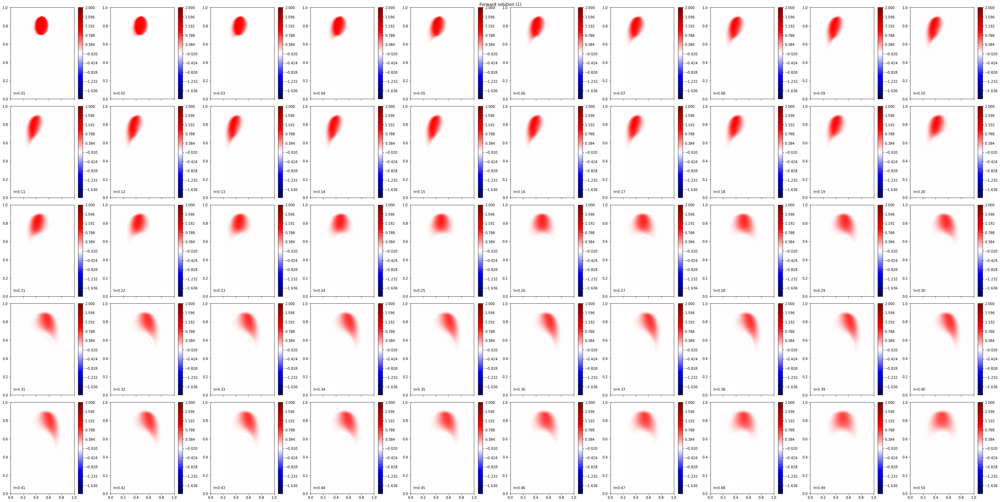

In [13]:
# print("New QOI: {:.5f}".format(mesh_seq.J))
def plot_field2(solutions, time_partition, field="u", label="forward", rows=None, cols=None, **kwargs):
    P = time_partition
    if rows is None or cols is None:
        rows = (P.exports_per_subinterval[0] - 1) // 2
        cols = (P.num_subintervals * 2)
    steady = rows == cols == 1
    print(rows, cols)
    dt = P.timesteps[0]
    figsize = kwargs.pop("figsize", (4 * cols, 4 * rows))
    fig, axes = plt.subplots(rows, cols, sharex="col", figsize=figsize)
    tcs = []
    idx = -1
    for i in range(rows):
        tc = []
        for j in range(cols):
            idx += 1
            ax = axes[i, j]
            # Element-wise norm for the indicators
            tc.append(tricontourf(solutions[field][label][idx][0], axes=ax, **kwargs))
            if not steady:
                time = (idx+1) * dt * timesteps_per_export
                ax.annotate(f"t={time:.2f}", (0.05, 0.05), color="black")
            fig.colorbar(tc[-1], ax=ax)
        tcs.append(tc)
    plt.tight_layout()
    return fig, axes, tcs

fig, axes, tcs = plot_field2(
    solutions, time_partition, "u", "forward", cmap='seismic',
    vmin=vmin, vmax=vmax, rows=rows, cols=cols, levels=np.linspace(vmin, vmax, 100))
plt.suptitle("Forward solution ({})".format(n_adapt), ha='center', va='top', y=1.0)

5 10


Text(0.5, 1.0, 'Adjoint solution (1)')

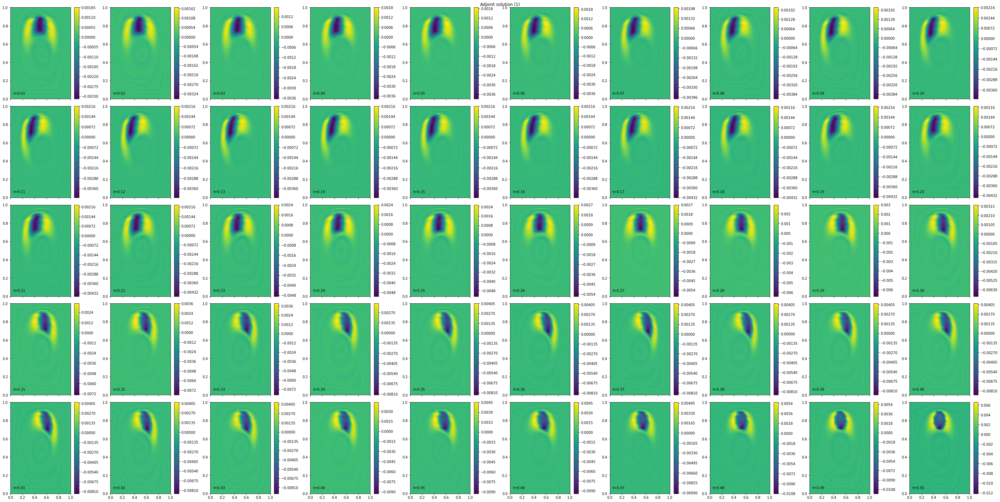

In [14]:
fig, axes, tcs = plot_field2(
    solutions, time_partition, "u", "adjoint", cmap='viridis', rows=rows, cols=cols, levels=100)
plt.suptitle("Adjoint solution ({})".format(n_adapt), ha='center', va='top', y=1.0)

## Fun experiment, use knowledge of the solution to cheat on the test

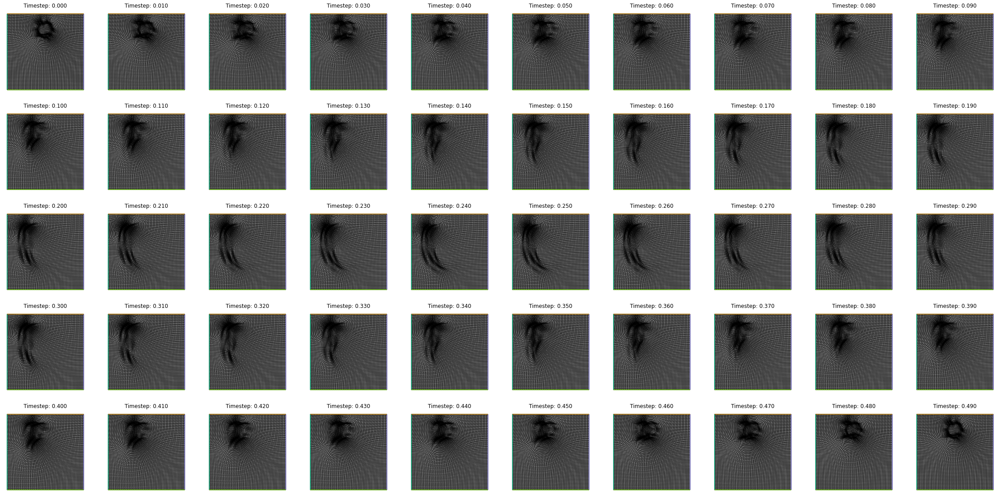

In [16]:
alt_meshes = [Mesh(mesh) for mesh in meshes]
alt_meshes[len(meshes)//2:] = meshes[:len(meshes)//2][::-1]
fig, axs = plt.subplots(rows, cols, figsize=(4 * cols, 4 * rows))
tps = []
tp = []
for i in range(len(meshes)):
    row, col = i // (len(meshes) // rows), i % cols
    _, _, plot = plot_mesh(alt_meshes[i], fig=fig, axes=axs[row, col])
    tp.append(plot)
    if time_partition is not None:
        time = i * dt * timesteps_per_export
        axs[row, col].set_title("Timestep: {:.3f}".format(time))
tps.append(tp)

In [17]:
mesh_seq = GoalOrientedMeshSeq(
    time_partition,
    alt_meshes,
    get_function_spaces=get_function_spaces,
    get_initial_condition=get_initial_condition,
    get_form=get_form,
    get_solver=get_solver,
    get_qoi=get_qoi,
    qoi_type="end_time",
)
alt_solutions = mesh_seq.solve_forward()
solutions = mesh_seq.solve_adjoint()
print(mesh_seq.J)

0.008955665732072666


5 10


Text(0.5, 1.0, 'Forward solution (Alt)')

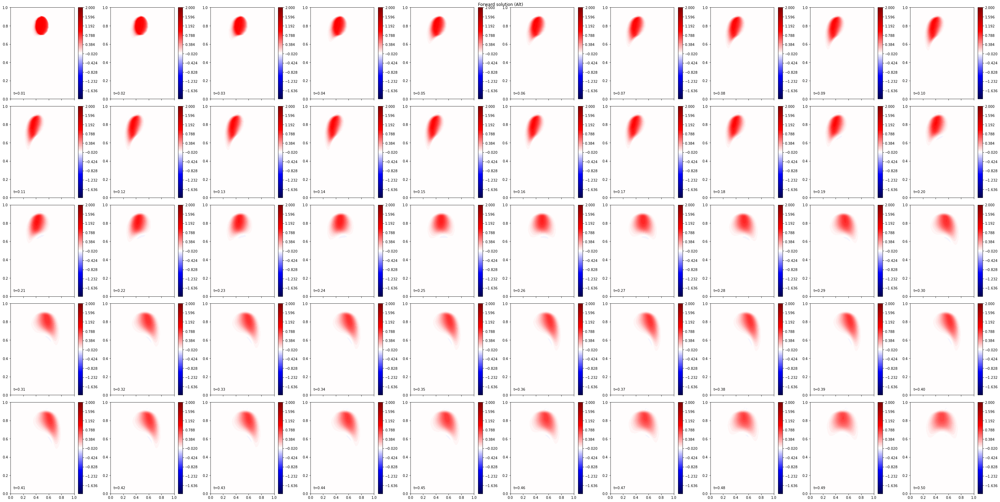

In [18]:

fig, axes, tcs = plot_field2(
    solutions, time_partition, "u", "forward", cmap='seismic',
    vmin=vmin, vmax=vmax, rows=rows, cols=cols, levels=np.linspace(vmin, vmax, 100))
plt.suptitle("Forward solution ({})".format("Alt"), ha='center', va='top', y=1.0)